# **StarGAN 실습**

## 학습목표

하나의 모델을 활용하여 multi-domain의 Image-to-Image Translation이 가능한 모델인 StarGAN에 대해 알아본다.

**목차(context)**
- StarGAN Dataset 알아보기
- StarGAN Training
- StarGAN Testing

> 이번 실습에서는 StarGAN 알고리즘을 직접 구현하는 실습을 진행해 본다.

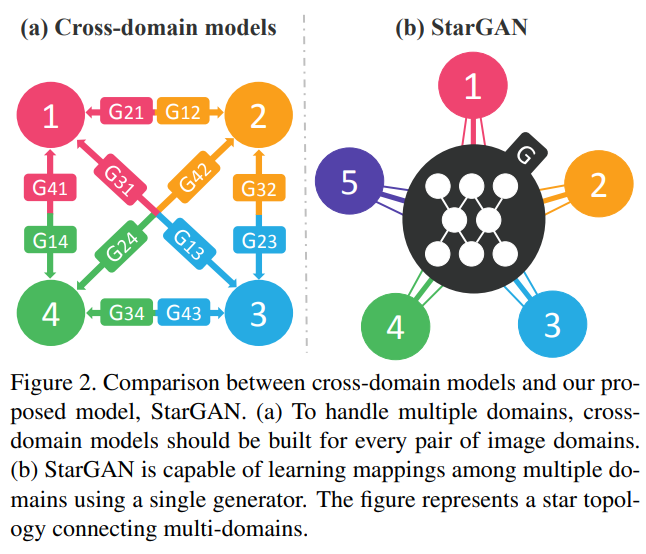

> CycleGAN의 경우 여러 domain에서 Image translation을 할 경우 필요한 Generator의 수가 기하급수적으로 늘어난다는 단점이 있다.
>
>StarGAN은 이러한 단점 보완해서 하나의 Discriminator와 Generator만으로 task 수행이 가능하도록 한다.
>
> 해당 모델은 입력값으로 도메인 정보와 원본 이미지를 받아 해당 이미지에 도메인 정보를 입힌 출력 이미지를 생성한다.

## 1. Import Packages

> 먼저, 필요한 package를 아래 코드를 사용하여 import 한다.

In [ ]:
# PyTorch 관련 된 라이브러리.
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim # optimization에 관한 모듈.
import torchvision # 이미지 관련 전처리, pretrained된 모델, 데이터 로딩에 관한 패키지
from torchvision.utils import save_image # 이미지 저장을 위한 torchvision의 모듈
import torchvision.datasets as vision_dsets
import torchvision.transforms as T # 이미지 전처리 모듈
from torchvision.datasets import ImageFolder
from torch.utils import data

# 기타 필요한 라이브러리.
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import time
import datetime
import random
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # GPU 사용
g_lr = 0.0001 # Generator의 learning rate
d_lr = 0.0001 # Discriminator의 learning rate
batch_size = 16 # mini-batch size

In [ ]:
!wget https://raw.githubusercontent.com/yunjey/stargan/master/download.sh
!bash download.sh celeba

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: ./data/celeba/images/195339.jpg  
  inflating: ./data/celeba/images/012465.jpg  
  inflating: ./data/celeba/images/089057.jpg  
  inflating: ./data/celeba/images/147796.jpg  
  inflating: ./data/celeba/images/192463.jpg  
  inflating: ./data/celeba/images/142818.jpg  
  inflating: ./data/celeba/images/148061.jpg  
  inflating: ./data/celeba/images/184432.jpg  
  inflating: ./data/celeba/images/201157.jpg  
  inflating: ./data/celeba/images/097288.jpg  
  inflating: ./data/celeba/images/130371.jpg  
  inflating: ./data/celeba/images/082864.jpg  
  inflating: ./data/celeba/images/017429.jpg  
  inflating: ./data/celeba/images/186077.jpg  
  inflating: ./data/celeba/images/126843.jpg  
  inflating: ./data/celeba/images/200381.jpg  
  inflating: ./data/celeba/images/012555.jpg  
  inflating: ./data/celeba/images/092238.jpg  
  inflating: ./data/celeba/images/008151.jpg  
  inflating: ./data/celeba/images/171418.jpg  
  inflating: ./data/cele

## 2. DataLoader

> CelebA의 경우에는 PyTorch에서 기본으로 제공하는 DataLoader가 없기에 조금 복잡한 DataLoader를 구현해줘야 한다. DataLoader의 경우는 각각의 Dataset들마다 프로그래밍하는 방향이 전부 다르다.

In [ ]:
class CelebA(data.Dataset):
    def __init__(self, image_dir, attr_path, selected_attrs, transform, mode):
        self.image_dir = image_dir
        self.attr_path = attr_path
        self.selected_attrs = selected_attrs
        self.transform = transform
        self.mode = mode
        self.train_dataset = []
        self.test_dataset = []
        self.attr2idx = {}
        self.idx2attr = {}
        self.preprocess()

        if mode == 'train':
            self.num_images = len(self.train_dataset)
        else:
            self.num_images = len(self.test_dataset)

    def preprocess(self):
        lines = [line.rstrip() for line in open(self.attr_path, 'r')]
        all_attr_names = lines[1].split()
        for i, attr_name in enumerate(all_attr_names):
            self.attr2idx[attr_name] = i
            self.idx2attr[i] = attr_name

        lines = lines[2:]
        random.seed(1234)
        random.shuffle(lines)
        for i, line in enumerate(lines):
            split = line.split()
            filename = split[0]
            values = split[1:]

            label = []
            for attr_name in self.selected_attrs:
                idx = self.attr2idx[attr_name]
                label.append(values[idx] == '1')

            if (i+1) < 2000:
                self.test_dataset.append([filename, label])
            else:
                self.train_dataset.append([filename, label])

        print('Finished preprocessing the CelebA dataset...')

    def __getitem__(self, index):
        dataset = self.train_dataset if self.mode == 'train' else self.test_dataset
        filename, label = dataset[index]
        image = Image.open(os.path.join(self.image_dir, filename))
        return self.transform(image), torch.FloatTensor(label)

    def __len__(self):
        return self.num_images

def get_loader(image_dir, attr_path, selected_attrs, crop_size=178, image_size=128,
               batch_size=16, dataset='CelebA', mode='train', num_workers=1):
    transform = []
    if mode == 'train':
        transform.append(T.RandomHorizontalFlip())
    transform.append(T.CenterCrop(crop_size))
    transform.append(T.Resize(image_size))
    transform.append(T.ToTensor())
    transform.append(T.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)))
    transform = T.Compose(transform)

    dataset = CelebA(image_dir, attr_path, selected_attrs, transform, mode)

    data_loader = data.DataLoader(dataset=dataset,
                                  batch_size=batch_size,
                                  shuffle=(mode=='train'),
                                  num_workers=num_workers)
    return data_loader

In [ ]:
#Dataloader들을 불러오기
celeba_image_dir = 'data/celeba/images'
attr_path = 'data/celeba/list_attr_celeba.txt'
selected_attrs = ['Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Male', 'Young']
celeba_crop_size = 178
image_size = 128
num_workers = 1

celeba_trainloader = get_loader(celeba_image_dir, attr_path, selected_attrs,
                           celeba_crop_size, image_size, batch_size,
                           'CelebA', mode='train', num_workers=num_workers)

celeba_testloader = get_loader(celeba_image_dir, attr_path, selected_attrs,
                           celeba_crop_size, image_size, batch_size,
                           'CelebA', mode='test', num_workers=num_workers)

Finished preprocessing the CelebA dataset...
Finished preprocessing the CelebA dataset...


> train 및 test Data를 시각화한 결과는 다음과 같다.

In [ ]:
import torchvision.transforms.functional as TF

<ipython-input-7-1279552cbe01>:5: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3277.)
  plt.imshow(TF.rotate(img, 90).T)


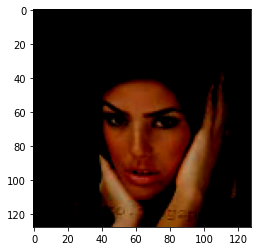

In [ ]:
t_fea, t_lab = next(iter(celeba_trainloader))

img = torch.squeeze(t_fea[0])
lab = t_lab[0]
plt.imshow(TF.rotate(img, 90).T)
plt.show()

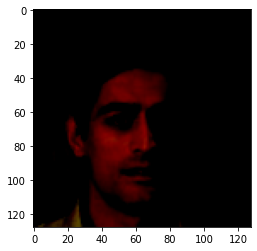

In [ ]:
te_fea, te_lab = next(iter(celeba_testloader))
img = torch.squeeze(te_fea[0])
lab = t_lab[0]
plt.imshow(TF.rotate(img, 90).T)
plt.show()

## 3. 모델 구현

### ResidualBlock

> Residual Block 이라는 개념은 2015년 Imagenet Challenge에서 ResNet이라는 모델이 우승을 차지하며 그 효과를 입증받은 모델이다.

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, dim_in, dim_out):
        super(ResidualBlock, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(dim_in, dim_out, kernel_size=3, stride=1, padding=1, bias=False),
            nn.InstanceNorm2d(dim_out, affine=True, track_running_stats=True),
            nn.ReLU(inplace=True),
            nn.Conv2d(dim_out, dim_out, kernel_size=3, stride=1, padding=1, bias=False),
            nn.InstanceNorm2d(dim_out, affine=True, track_running_stats=True))

    def forward(self, x):
        return x + self.main(x)

> **conv:** 코드 단순화를 위한 convolution block 생성을 위한 함수이다. Conv → InstanceNorm → Activation Function 으로 이어지는 일련의 레이어를 생성한다.

In [ ]:
def conv(c_in, c_out, k_size, stride=2, pad=1, In=True, activation='relu'):
    layers = []

    # Conv 진행
    layers.append(nn.Conv2d(c_in, c_out, k_size, stride, pad, bias=False))

    # Instance Norm 진행
    if In:
        layers.append(nn.InstanceNorm2d(c_out, affine=True, track_running_stats=True))

    # Activation 진행
    if activation == 'lrelu':
        layers.append(nn.LeakyReLU(0.01))
    if activation == 'tanh':
        layers.append(nn.Tanh())
    if activation == 'relu':
        layers.append(nn.ReLU(inplace=True))
    if activation == 'none':
        pass

    return nn.Sequential(*layers)

> **deconv:** 코드 단순화를 위한 deconvolution block 생성을 위한 함수이다. Deconv → Activation function 으로 이어지는 일련의 레이어를 생성한다.

In [ ]:
def deconv(c_in, c_out, k_size, stride=2, pad=1, In=True, activation='relu'):
    layers = []

    # Deconv 과정
    layers.append(nn.ConvTranspose2d(c_in, c_out, k_size, stride, pad, bias=False))

    if In:
        layers.append(nn.InstanceNorm2d(c_out, affine=True, track_running_stats=True))

    # Activation 과정
    if activation == 'lrelu':
        layers.append(nn.LeakyReLU(0.01))
    if activation == 'tanh':
        layers.append(nn.Tanh())
    if activation == 'relu':
        layers.append(nn.ReLU(inplace=True))
    if activation == 'none':
        pass

    return nn.Sequential(*layers)

### Generator, Discriminator 구현

> Generator와 Discriminator를 선언한다.
이 때 StarGAN의 Generator에는 input image와 target attribute에 대한 입력값을 받는 것을 기억한다.

In [ ]:
class Generator(nn.Module):
    """Generator 클래스."""
    def __init__(self, conv_dim=64, c_dim=5):
        super(Generator, self).__init__()

        layers = []
        self.conv1 = conv(3+c_dim, conv_dim, 7, 1, 3)

        # Down-sampling 레이어
        self.conv2 = conv(conv_dim, conv_dim * 2, 4, 2, 1)
        self.conv3 = conv(conv_dim * 2, conv_dim * 4, 4, 2, 1)

        # Bottleneck 레이어
        self.res1 = ResidualBlock(dim_in=conv_dim * 4, dim_out=conv_dim * 4)
        self.res2 = ResidualBlock(dim_in=conv_dim * 4, dim_out=conv_dim * 4)
        self.res3 = ResidualBlock(dim_in=conv_dim * 4, dim_out=conv_dim * 4)
        self.res4 = ResidualBlock(dim_in=conv_dim * 4, dim_out=conv_dim * 4)
        self.res5 = ResidualBlock(dim_in=conv_dim * 4, dim_out=conv_dim * 4)
        self.res6 = ResidualBlock(dim_in=conv_dim * 4, dim_out=conv_dim * 4)

        # Up-sampling 레이어
        self.deconv1 = deconv(conv_dim * 4, conv_dim * 2, 4, 2, 1)
        self.deconv2 = deconv(conv_dim * 2, conv_dim, 4, 2, 1)
        self.conv4 = conv(conv_dim, 3, 7, 1, 3, In=False, activation=None)
        self.tanh = nn.Tanh()

    def forward(self, x, c):
        # target domain인 c를 입력 이미지 x의 사이즈와 동일하게 제작.
        # concatenate하여 모델에 입력으로 제공.
        c = c.view(c.size(0), c.size(1), 1, 1)
        c = c.repeat(1, 1, x.size(2), x.size(3))
        x = torch.cat([x, c], dim=1)

        out = self.conv1(x)
        out = self.conv2(out)
        out = self.conv3(out)

        out = self.res1(out)
        out = self.res2(out)
        out = self.res3(out)
        out = self.res4(out)
        out = self.res5(out)
        out = self.res6(out)

        out = self.deconv1(out)
        out = self.deconv2(out)
        out = self.conv4(out)
        out = self.tanh(out)

        return out

In [ ]:
class Discriminator(nn.Module):
    """PatchGAN을 활용한 Discriminator 클래스."""
    def __init__(self, image_size=128, conv_dim=64, c_dim=5):
        super(Discriminator, self).__init__()

        self.conv1 = conv(3, conv_dim, 4, 2, 1, In=False, activation='lrelu')

        self.conv2 = conv(conv_dim, conv_dim * 2, 4, 2, 1, In=False, activation='lrelu')
        self.conv3 = conv(conv_dim * 2, conv_dim * 4, 4, 2, 1, In=False, activation='lrelu')
        self.conv4 = conv(conv_dim * 4, conv_dim * 8, 4, 2, 1, In=False, activation='lrelu')
        self.conv5 = conv(conv_dim * 8, conv_dim * 16, 4, 2, 1, In=False, activation='lrelu')
        self.conv6 = conv(conv_dim * 16, conv_dim * 32, 4, 2, 1, In=False, activation='lrelu')

        kernel_size = int(image_size / np.power(2, 6))
        self.gen = nn.Conv2d(conv_dim * 32, 1, kernel_size=3, stride=1, padding=1, bias=False)
        self.cls = nn.Conv2d(conv_dim * 32, c_dim, kernel_size=kernel_size, bias=False)

    def forward(self, x):
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.conv5(out)
        out = self.conv6(out)

        out_gen = self.gen(out)
        out_cls = self.cls(out)

        return out_gen, out_cls.view(out_cls.size(0), out_cls.size(1))

## 4. 학습을 위한 사전 모델/optimizer 선언 & 기타준비

In [ ]:
# 모델 선언 및 train모드로 제작
G = Generator(64, 5).train()
D = Discriminator(128, 64, 5).train()

# 선언한 모델들을 GPU에서 사용할 수 있도록 설정
G.to(device)
D.to(device)

# Optimizer 선언
g_optimizer = torch.optim.Adam(G.parameters(), lr=g_lr, betas=(0.5, 0.999))
d_optimizer = torch.optim.Adam(D.parameters(), lr=d_lr, betas=(0.5, 0.999))

# Iteration 수 선언
num_iters = 20000

# training 과정에서 생성되는 이미지 변화 보도록 고정된 샘플 데이터를 지정.
celeba_iter = iter(celeba_trainloader)
x_fixed, c_org = next(celeba_iter)
x_fixed = x_fixed.to(device)
sample_step = 10000
sample_dir = 'stargan_celeba/samples' #샘플 데이터에 대한 모델 출력 결과가 저장되는 디렉토리.
if not os.path.exists(sample_dir):
    os.makedirs(sample_dir)

#training 과정에서 모델의 파라미터를 저장.
model_save_dir = 'stargan_celeba/models'
if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)

In [ ]:
def create_labels(c_org, c_dim=5, selected_attrs=None):
        """Debugging과 Testing을 위한 Target domain label들을 생성하는 함수."""
        # hair color indices 받아오기
        hair_color_indices = []
        for i, attr_name in enumerate(selected_attrs):
            if attr_name in ['Black_Hair', 'Blond_Hair', 'Brown_Hair', 'Gray_Hair']:
                hair_color_indices.append(i)

        c_trg_list = []
        for i in range(c_dim):
            c_trg = c_org.clone()
            if i in hair_color_indices:  # 한 가지의 hair color 지정
                c_trg[:, i] = 1
                for j in hair_color_indices:
                    if j != i:
                        c_trg[:, j] = 0
            else:
                c_trg[:, i] = (c_trg[:, i] == 0)  # 속성 값을 뒤집음.

            c_trg_list.append(c_trg.to(device))
        return c_trg_list

c_fixed_list = create_labels(c_org, 5, selected_attrs=selected_attrs)

> 다음은 Training 과정에서 사용되는 gradient penalty loss의 함수이다. Training 프로세스를 안정화시키고, 더 고품질의 이미지를 생성하기 위하여 StarGAN에서는 Adversarial Loss를 WGAN과 Improved WGAN에서 제안된 목적함수와 gradient penalty가 포함된 형태로 반영하였다.

In [ ]:
def gradient_penalty(y, x):
        """gradient penalty 계산: (L2_norm(dy/dx) - 1)**2."""
        weight = torch.ones(y.size()).to(device)
        dydx = torch.autograd.grad(outputs=y,
                                   inputs=x,
                                   grad_outputs=weight,
                                   retain_graph=True,
                                   create_graph=True,
                                   only_inputs=True)[0]

        dydx = dydx.view(dydx.size(0), -1)
        dydx_l2norm = torch.sqrt(torch.sum(dydx**2, dim=1))
        return torch.mean((dydx_l2norm-1)**2)

# 이미지 저장 과정에서 사용되는 스케일링 함수.
def denorm(x):
    """[-1, 1] 에서 [0, 1]로 range를 변환."""
    out = (x + 1) / 2
    return out.clamp_(0, 1)

## 5. Training & Testing StarGAN

> 여기서의 loss는 크게 7가지로 나누어 진다.

- D: Real images들을 1로 분류하기 위한 loss (d_loss_real)
- D: Fake images들을 0로 분류하기 위한 loss (d_loss_fake)
- D: Images의 domain을 분류하기 위한 loss (d_loss_cls)
- D: gradient penalty loss (d_loss_gp)

- G: D를 속이는 Fake images들을 만들기 위한 loss (D에서 1로 분류함) (g_loss_fake)
- G: 생성된 Target 이미지에서 Original 이미지로 다시 돌아 갔을 때 reconstruction을 위한 loss (g_loss_rec)
- G: Images의 domain을 분류하기 위한 loss (g_loss_cls)

In [ ]:
D_loss_fake_data = []
D_loss_cls_data = []
D_loss_gp_data = []
D_loss_real_data = []
G_loss_fake_data = []
G_loss_rec_data = []
G_loss_cls_data = []

start_time = time.time()
for step in range(num_iters):
    try:
        x_real, label_org = next(celeba_iter)
    except:
        celeba_iter = iter(celeba_trainloader)
        x_real, label_org = next(celeba_iter)

    # 변환하고자 하는 domain의 label을 랜덤생성.
    rand_idx = torch.randperm(label_org.size(0))
    label_trg = label_org[rand_idx]

    c_org = label_org.clone()
    c_trg = label_trg.clone()

    x_real = x_real.to(device)           # 입력 이미지
    c_org = c_org.to(device)             # 원래 domain label들
    c_trg = c_trg.to(device)             # Target domain label들.
    label_org = label_org.to(device)     # computing classification loss를 위한 label.
    label_trg = label_trg.to(device)     # computing classification loss를 위한 label.

    # =================================================================================== #
    #                             1. Discriminator 학습                                   #
    # =================================================================================== #

    # 실제 이미지를 활용한 loss 계산
    out_src, out_cls = D(x_real)
    d_loss_real = - torch.mean(out_src)
    d_loss_cls = F.binary_cross_entropy_with_logits(out_cls, label_org, size_average=False) / out_cls.size(0)

    # fake 이미지를 활용한 loss 계산.
    x_fake = G(x_real, c_trg)
    out_src, out_cls = D(x_fake.detach())
    d_loss_fake = torch.mean(out_src)

    # gradient penalty를 위한 loss 계산.
    alpha = torch.rand(x_real.size(0), 1, 1, 1).to(device)
    x_hat = (alpha * x_real.data + (1 - alpha) * x_fake.data).requires_grad_(True)
    out_src, _ = D(x_hat)
    d_loss_gp = gradient_penalty(out_src, x_hat)

    # Backward 및 optimize.
    d_loss = d_loss_real + d_loss_fake + 1.0 * d_loss_cls + 10.0 * d_loss_gp
    D.zero_grad()
    d_loss.backward()
    d_optimizer.step()

    # 로깅 작업.
    loss = {}
    loss['D/loss_real'] = d_loss_real.item()
    loss['D/loss_fake'] = d_loss_fake.item()
    loss['D/loss_cls'] = d_loss_cls.item()
    loss['D/loss_gp'] = d_loss_gp.item()

    # =================================================================================== #
    #                               2. Generator 학습                                     #
    # =================================================================================== #

    if (step +1) % 5 == 0:
        # Original-to-target 도메인 학습
        x_fake = G(x_real, c_trg)
        out_src, out_cls = D(x_fake)
        g_loss_fake = - torch.mean(out_src)
        g_loss_cls = F.binary_cross_entropy_with_logits(out_cls, label_trg, size_average=False) / out_cls.size(0)

        # Target-to-original 도메인 학습
        x_reconst = G(x_fake, c_org)
        g_loss_rec = torch.mean(torch.abs(x_real - x_reconst))

        # Backward 및 optimize.
        g_loss = g_loss_fake + 10.0 * g_loss_rec + 1.0 * g_loss_cls
        G.zero_grad()
        g_loss.backward()
        g_optimizer.step()

        # 로깅 작업.
        loss['G/loss_fake'] = g_loss_fake.item()
        loss['G/loss_rec'] = g_loss_rec.item()
        loss['G/loss_cls'] = g_loss_cls.item()

    if (step + 1) % 10 == 0: #10 iteration마다 학습 중의 Loss들을 출력.
            et = time.time() - start_time
            et = str(datetime.timedelta(seconds=et))[:-7]
            log = "Elapsed [{}], Iteration [{}/{}]".format(et, step+1, num_iters)
            for tag, value in loss.items():
                log += ", {}: {:.4f}".format(tag, value)
            print(log)

            D_loss_fake_data.append(float(d_loss_fake.item()))
            D_loss_real_data.append(float(d_loss_real.item()))
            D_loss_cls_data.append(float(d_loss_cls.item()))
            D_loss_gp_data.append(float(d_loss_gp.item()))
            G_loss_fake_data.append(float(g_loss_fake.item()))
            G_loss_rec_data.append(float(g_loss_rec.item()))
            G_loss_cls_data.append(float(g_loss_cls.item()))

    if (step + 1) % 1000 == 0: #1000 iteration마다 특정 이미지의 translation 결과를 저장.
        with torch.no_grad():
            x_fake_list = [x_fixed]
            for c_fixed in c_fixed_list:
                x_fake_list.append(G(x_fixed, c_fixed))
            x_concat = torch.cat(x_fake_list, dim=3)
            sample_path = os.path.join(sample_dir, '{}-images.jpg'.format(step+1))
            save_image(denorm(x_concat.data.cpu()), sample_path, nrow=1, padding=0)
            print('Saved real and fake images into {}...'.format(sample_path))

    if (step + 1) % 10000 == 0: #10000 iteration마다 모델을 저장.
        G_path = os.path.join(model_save_dir, '{}-G.ckpt'.format(step+1))
        D_path = os.path.join(model_save_dir, '{}-D.ckpt'.format(step+1))
        torch.save(G.state_dict(), G_path)
        torch.save(D.state_dict(), D_path)
        print('Saved model checkpoints into {}...'.format(model_save_dir))

/usr/local/lib/python3.8/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


Elapsed [0:00:11], Iteration [10/20000], D/loss_real: -20.0885, D/loss_fake: 6.6292, D/loss_cls: 3.9027, D/loss_gp: 0.0912, G/loss_fake: -5.3465, G/loss_rec: 0.5093, G/loss_cls: 2.9127
Elapsed [0:00:16], Iteration [20/20000], D/loss_real: -33.6878, D/loss_fake: 5.7809, D/loss_cls: 6.2352, D/loss_gp: 0.4866, G/loss_fake: -5.4447, G/loss_rec: 0.4625, G/loss_cls: 3.2985
Elapsed [0:00:20], Iteration [30/20000], D/loss_real: -32.5408, D/loss_fake: 9.6526, D/loss_cls: 4.6081, D/loss_gp: 0.3207, G/loss_fake: -10.2038, G/loss_rec: 0.5713, G/loss_cls: 2.8043
Elapsed [0:00:25], Iteration [40/20000], D/loss_real: -6.4487, D/loss_fake: -0.4708, D/loss_cls: 3.3514, D/loss_gp: 0.0201, G/loss_fake: 1.0545, G/loss_rec: 0.4640, G/loss_cls: 3.2262
Elapsed [0:00:30], Iteration [50/20000], D/loss_real: -15.7393, D/loss_fake: 6.6355, D/loss_cls: 3.1431, D/loss_gp: 0.0498, G/loss_fake: -1.5600, G/loss_rec: 0.5008, G/loss_cls: 3.0482
Elapsed [0:00:35], Iteration [60/20000], D/loss_real: -9.8807, D/loss_fake:

KeyboardInterrupt: ignored

> 각 Step마다의 StarGAN 이미지 생성 결과는 다음과 같다.

Saved real and fake images into ./stargan_celeba/samples/1000-images.jpg...


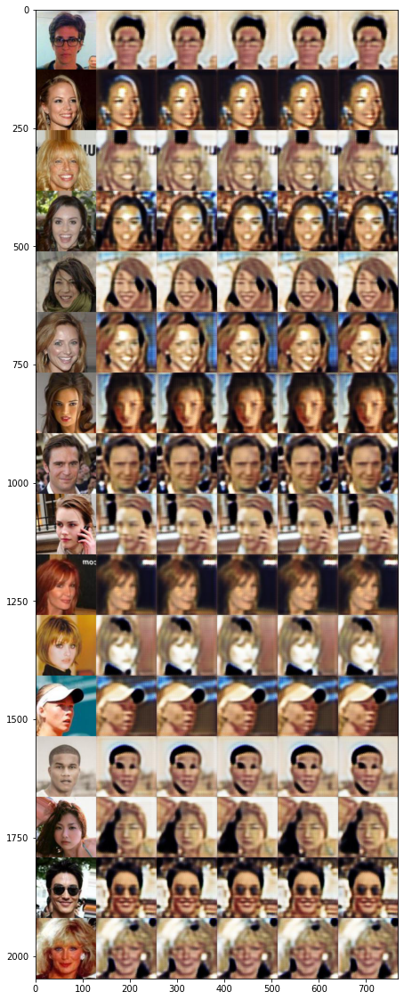

Saved real and fake images into ./stargan_celeba/samples/2000-images.jpg...


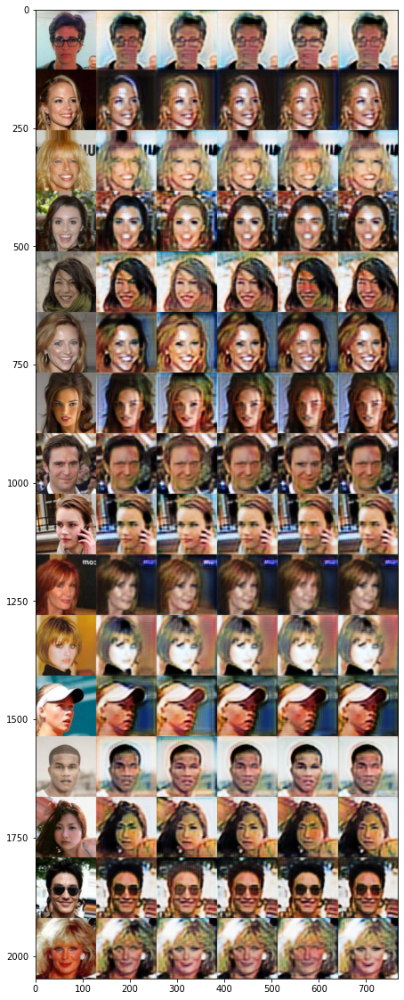

Saved real and fake images into ./stargan_celeba/samples/3000-images.jpg...


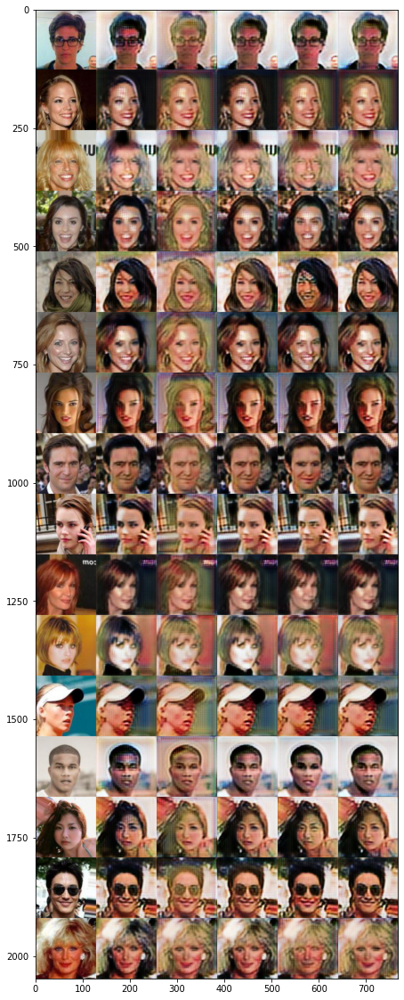

Saved real and fake images into ./stargan_celeba/samples/4000-images.jpg...


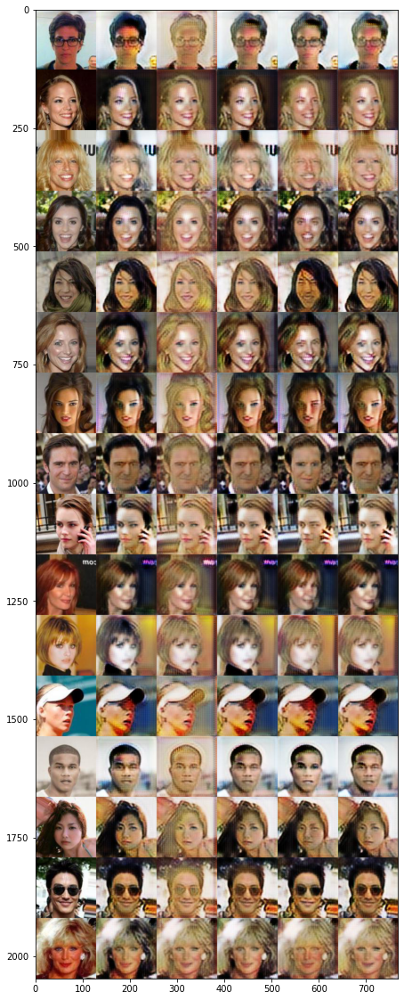

Saved real and fake images into ./stargan_celeba/samples/5000-images.jpg...


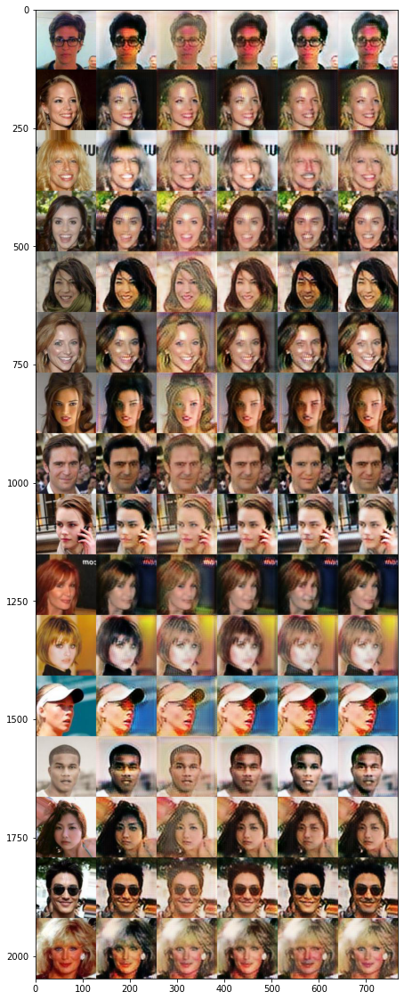

Saved real and fake images into ./stargan_celeba/samples/6000-images.jpg...


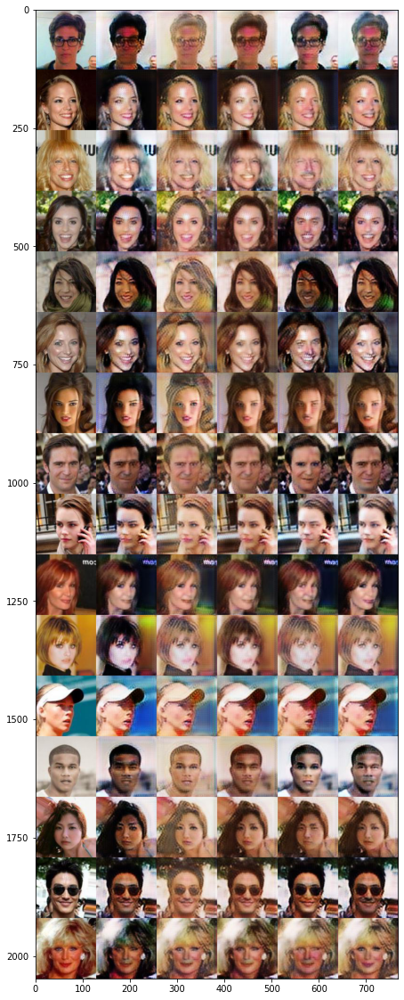

Saved real and fake images into ./stargan_celeba/samples/7000-images.jpg...


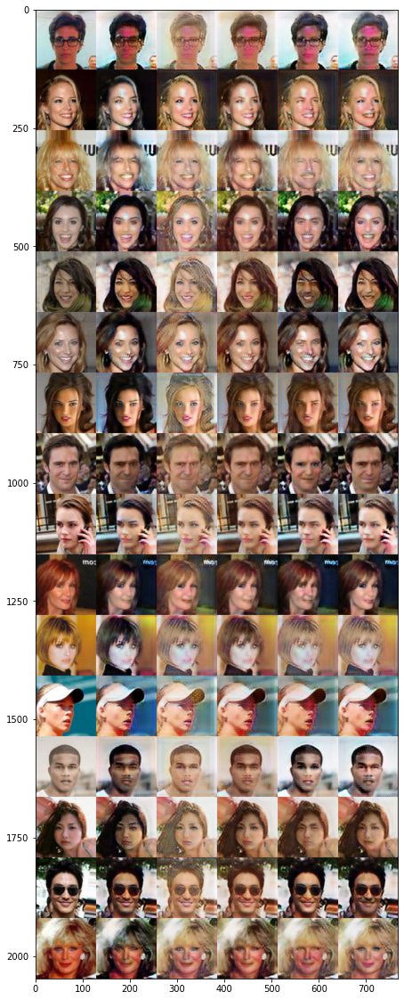

Saved real and fake images into ./stargan_celeba/samples/8000-images.jpg...


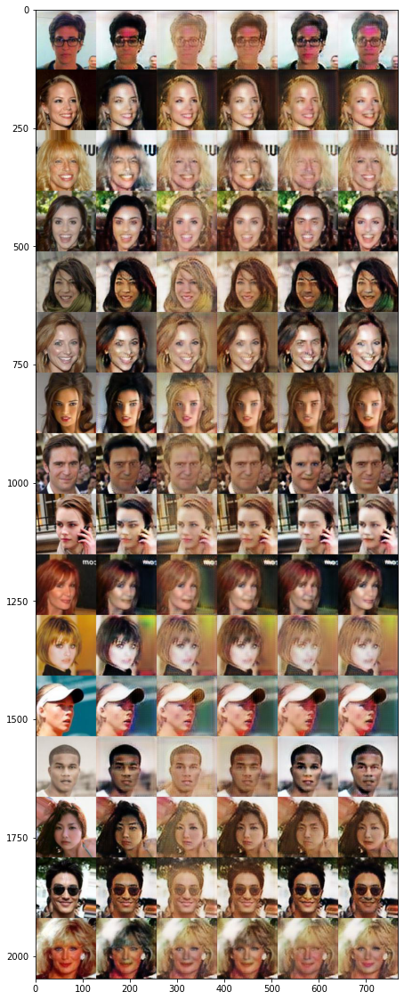

Saved real and fake images into ./stargan_celeba/samples/9000-images.jpg...


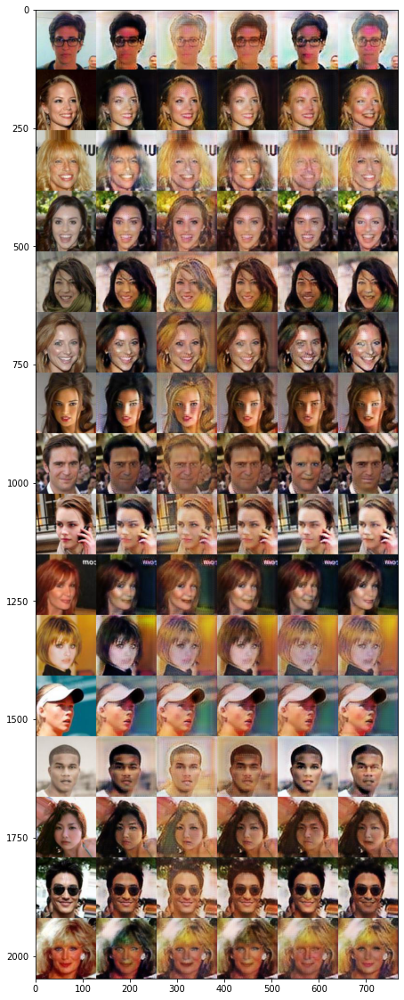

In [ ]:
for i in range(1, step//1000):
  sample_path = os.path.join('./'+sample_dir, '{}-images.jpg'.format((i*1000)))
  print('Saved real and fake images into {}...'.format(sample_path))
  img_test = mpimg.imread(sample_path)
  plt.figure(figsize = (200,20))
  plt.imshow(img_test)
  plt.show()

> Discriminator와 Generator loss를 plot한 결과는 아래와 같다.

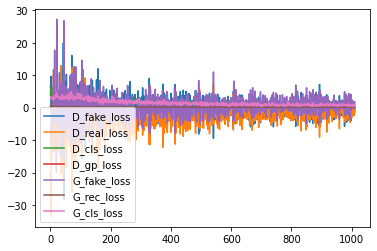

In [ ]:
plt.plot(D_loss_fake_data, label='D_fake_loss')
plt.plot(D_loss_real_data, label='D_real_loss')
plt.plot(D_loss_cls_data, label='D_cls_loss')
plt.plot(D_loss_gp_data, label='D_gp_loss')
plt.plot(G_loss_fake_data, label='G_fake_loss')
plt.plot(G_loss_rec_data, label='G_rec_loss')
plt.plot(G_loss_cls_data, label='G_cls_loss')
plt.legend()
plt.show()